- 27/07/23: v1 from existing demo cases plus new dataset.
- 28/07/23: complete analysis in place up to MF PAD plotting, this needs some additional work (subselection issues). Tested only with minimal N2 dataset so far.

(chpt:n2-case-study)=
# Case study: Generalised bootstrapping for a homonuclear diatomic scattering system, $N_2~(D_{\infty h})$

In this chapter, the full code and analysis details of the case study for $N_2$ are given, including obtaining required data, running fits and analysis routines. For more details on the routines, see the {{ PEMtk_docs }}; for the analysis see particularly the [fit fidelity and analysis page](https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_analysis_demo_150621-tidy.html), and [molecular frame analysis data processing page](https://pemtk.readthedocs.io/en/latest/topical_review_case_study/matrix_element_extraction_MFrecon_PEMtk_180722-dist.html) (full analysis for Ref. {cite}`hockett2023TopicalReviewExtracting`, illustrating the $N_2$ case).

## General setup

In the following code cells (see source notebooks for full details) the general setup routines (as per the outline in {numref}`Chpt. %s <sect:basic-fit-setup>` are executed via a configuration script with presets for the case studies herein.

Additionally, the routines will either run fits, or load existing data if available. Since fitting can be computationally demanding, it is, in general, recommended to approach large fitting problems carefully.

````{margin}
```{admonition} General note on fitting

Computational outputs in this chapter are significantly truncated in the PDF, see source notebooks or HTML version for full details.

```
````

In [1]:
# Configure settings for case study

# Set case study by name
fitSystem='N2'
fitStem=f"fit_withNoise_orb5"

# Add noise?
addNoise = 'y'
mu, sigma = 0, 0.05  # Up to approx 10% noise (+/- 0.05)

# Batching - number of fits to run between data dumps
batchSize = 10

# Total fits to run
nMax = 10

In [2]:
# Run default config - may need to set full path here

%run '../scripts/setup_notebook.py'

# Set outputs for notebook or PDF (skips Holoviews plots unless glued)
# Note this is set to default 'pl' in script above
if buildEnv == 'pdf':
    paramPlotBackend = 'sns'    # For category plots with paramPlot
else:
    paramPlotBackend = 'hv'
    
# plotBackend = 'sns'    # For category plots with paramPlot

*** Setting up notebook with standard Quantum Metrology Vol. 3 imports...
For more details see https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_fitting_basic_demo_030621-full.html
To use local source code, pass the parent path to this script at run time, e.g. "setup_fit_demo ~/github"

*** Running: 2023-07-28 15:25:19
Working dir: /home/jovyan/QM3/doc-source/part2
Build env: notebook

* Loading packages...


* sparse not found, sparse matrix forms not available. 
* natsort not found, some sorting functions not available. 


* Setting plotter defaults with epsproc.basicPlotters.setPlotters(). Run directly to modify, or change options in local env.


* Set Holoviews with bokeh.
* pyevtk not found, VTK export not available. 


* Set Holoviews with bokeh.
Jupyter Book      : 0.15.1
External ToC      : 0.3.1
MyST-Parser       : 0.18.1
MyST-NB           : 0.17.2
Sphinx Book Theme : 1.0.1
Jupyter-Cache     : 0.6.1
NbClient          : 0.7.4


In [3]:
# Pull data from web (N2 case)

from epsproc.util.io import getFilesFromGithub

# Set dataName (will be used as download subdir)
dataName = 'n2fitting'
# N2 matrix elements
fDictMatE, fAllMatE = getFilesFromGithub(subpath='data/photoionization/n2_multiorb', dataName=dataName)  
# N2 alignment data
fDictADM, fAllMatADM = getFilesFromGithub(subpath='data/alignment', dataName=dataName)

Querying URL: https://api.github.com/repos/phockett/epsproc/contents/data/photoionization/n2_multiorb
Local file /home/jovyan/QM3/doc-source/part2/n2fitting/n2_1pu_0.1-50.1eV_A2.inp.out already exists
Local file /home/jovyan/QM3/doc-source/part2/n2fitting/n2_3sg_0.1-50.1eV_A2.inp.out already exists
Querying URL: https://api.github.com/repos/phockett/epsproc/contents/data/alignment
Local file /home/jovyan/QM3/doc-source/part2/n2fitting/N2_ADM_VM_290816.mat already exists


*** Setting up demo fitting workspace and main `data` class object...
Script: QM3 case studies
For more details see https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_fitting_basic_demo_030621-full.html
To use local source code, pass the parent path to this script at run time, e.g. "setup_fit_demo ~/github"


* Loading packages...

* Loading demo matrix element data from /home/jovyan/QM3/doc-source/part2/n2fitting

*** Job subset details
Key: subset
No 'job' info set for self.data[subset].

*** Job orb6 details
Key: orb6
Dir /home/jovyan/QM3/doc-source/part2/n2fitting, 1 file(s).
{   'batch': 'ePS n2, batch n2_1pu_0.1-50.1eV, orbital A2',
    'event': ' N2 A-state (1piu-1)',
    'orbE': -17.09691397835426,
    'orbLabel': '1piu-1'}

*** Job orb5 details
Key: orb5
Dir /home/jovyan/QM3/doc-source/part2/n2fitting, 1 file(s).
{   'batch': 'ePS n2, batch n2_3sg_0.1-50.1eV, orbital A2',
    'event': ' N2 X-state (3sg-1)',
    'orbE': -17.34181645456815,
    'orbLabel': '3sg-1'}

*** Job su

name,value,initial value,min,max,vary,expression
m_PU_SG_PU_1_n1_1_1,1.78461575,1.784615753610107,1.0000e-04,5.00000000,True,
m_PU_SG_PU_1_1_n1_1,1.78461575,1.784615753610107,1.0000e-04,5.00000000,False,m_PU_SG_PU_1_n1_1_1
m_PU_SG_PU_3_n1_1_1,0.80290495,0.802904951323892,1.0000e-04,5.00000000,True,
m_PU_SG_PU_3_1_n1_1,0.80290495,0.802904951323892,1.0000e-04,5.00000000,False,m_PU_SG_PU_3_n1_1_1
m_SU_SG_SU_1_0_0_1,2.68606212,2.686062120382649,1.0000e-04,5.00000000,True,
m_SU_SG_SU_3_0_0_1,1.10915311,1.109153108617096,1.0000e-04,5.00000000,True,
p_PU_SG_PU_1_n1_1_1,-0.86104140,-0.8610414024232179,-3.14159265,3.14159265,False,
p_PU_SG_PU_1_1_n1_1,-0.86104140,-0.8610414024232179,-3.14159265,3.14159265,False,p_PU_SG_PU_1_n1_1_1
p_PU_SG_PU_3_n1_1_1,-3.12044446,-3.1204444620772467,-3.14159265,3.14159265,True,
p_PU_SG_PU_3_1_n1_1,-3.12044446,-3.1204444620772467,-3.14159265,3.14159265,False,p_PU_SG_PU_3_n1_1_1



*** Adding Gaussian noise, mu=0, sigma=0.05


*** Setup demo fitting workspace OK.
Dataset: subset, AFBLM
Dataset: sim, AFBLM


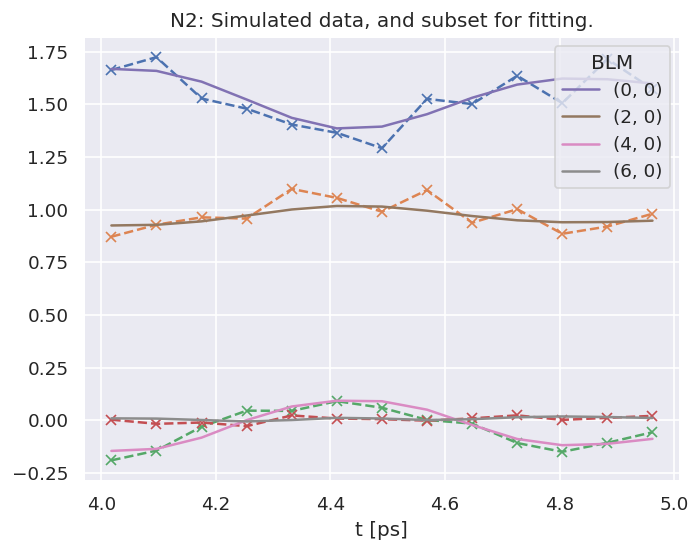

In [4]:
# Fitting setup including data generation and parameter creation

# Set datapath, 
dataPath = Path(Path.cwd(),dataName)

# Run general config script with dataPath set above
%run "../scripts/setup_fit_case-studies_270723.py" -d {dataPath} -c {fitSystem} -n {addNoise} --sigma {sigma}

## Load existing fit data or run fits

Note that running fits may be quite time-consuming and computationally intensive, depending on the size of the size of the problem. The default case here will run a small batch for testing if there is no existing data found on the `dataPath`, otherwise the data is loaded for analysis.

Set dataFiles: /home/jovyan/QM3/doc-source/part2/n2fitting/N2_39_fit_withNoise_orb5_280723_10-22-38.pickle
Read data from /home/jovyan/QM3/doc-source/part2/n2fitting/N2_39_fit_withNoise_orb5_280723_10-22-38.pickle with pickle.
Dataset: subset, AFBLM
Dataset: sim, AFBLM


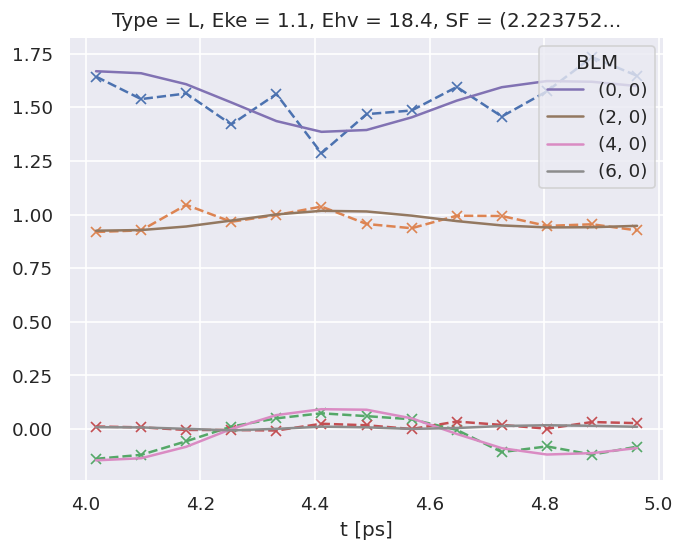

In [5]:
# Look for existing Pickle files on path
dataFiles = list(dataPath.expanduser().glob('*.pickle'))

if not dataFiles:
    print("No data found, executing minimal fitting run...")
    
    # Run fit batch - single
    # data.multiFit(nRange = [n,n+batchSize-1], num_workers=batchSize)

    # Run fit batches with checkpoint files
    for n in np.arange(0,nMax,batchSize):
        print(f'*** Running batch [{n},{n+batchSize-1}], {dt.now().strftime("%d%m%y_%H-%M-%S")}')

        # Run fit batch
        data.multiFit(nRange = [n,n+batchSize-1], num_workers=batchSize)

        # Dump data so far
        data.writeFitData(outStem=f"{fitSystem}_{n+batchSize-1}_{fitStem}")
        
        print(f'Finished batch [{n},{n+batchSize-1}], {dt.now().strftime("%d%m%y_%H-%M-%S")}')
        print(f'Written to file {fitSystem}_{n+batchSize-1}_{fitStem}')

else:
    dataFileIn = dataFiles[-1]   # Add index to select file, although loadFitData will concat multiple files
                                    # Note that concat currently only works for fixed batch sizes however.
    print(f"Set dataFiles: {dataFileIn}")
    data.loadFitData(fList=dataFileIn, dataPath=dataPath)   #.expanduser())
    
    data.BLMfitPlot(keys=['subset','sim'])
    

In [6]:
# Fits appear as integer indexed items in the main data structure.
data.data.keys()

dict_keys(['subset', 'orb6', 'orb5', 'ADM', 'pol', 'sim', 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38])

## Post-processing and data overview

Post-processing involves aggregation of all the fit run results into a single data structure. This can then be analysed statistically and examined for for best-fit results. In the statistical sense, this is essentailly a search for candidate {{ RADMATE }}, based on the assumption that some of the minima found in the $chi^2$ hyperspace will be the true results. Even if a clear global minima does not exist, searching for candidate {{ RADMATE }} sets based on clustering of results and multiple local minima is still expected to lead to viable candidates provided that the information content of the dataset is sufficient. However, as discussed elsewhere (see {numref}`Sect. %s <sect:numerics:fitting-strategies>`), in some cases this may not be the case, and other limitations may apply (e.g. certain parameters may be undefined), or additional data required for unique determination of the {{ RADMATE }}.

For more details on the analysis routines, see the {{ PEMtk_docs }}, particularly the [fit fidelity and analysis page](https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_analysis_demo_150621-tidy.html), and [molecular frame analysis data processing page](https://pemtk.readthedocs.io/en/latest/topical_review_case_study/matrix_element_extraction_MFrecon_PEMtk_180722-dist.html) (full analysis for Ref. {cite}`hockett2023TopicalReviewExtracting`, illustrating the $N_2$ case).

In [7]:
# General stats & post-processing to data tables
data.analyseFits()

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
{ 'Fits': 39,
  'Minima': {'chisqr': 0.1141449313162804, 'redchi': 0.0007660733645387946},
  'Stats': { 'chisqr': min       0.114
mean      0.128
median    0.114
max       0.556
std       0.071
var       0.005
Name: chisqr, dtype: float64,
             'redchi': min       7.661e-04
mean      8.583e-04
median    7.661e-04
max       3.731e-03
std       4.741e-04
var       2.248e-07
Name: redchi, dtype: float64},
  'Success': 39}


In [8]:
# The BLMsetPlot routine will output aggregate fit results.
# Here the spread can be taken as a general indication of the uncertainty of 
# the fitting, and indicate whether the fit is well-characterised/the information 
# content of the data is sufficient.
data.BLMsetPlot(xDim = 't', thres=1e-6)  # With xDim and thres set, for more control over outputs


:Overlay
   .NdOverlay.I  :NdOverlay   [l,m]
      :Spread   [t]   (BLM,BLM_std)
   .NdOverlay.II :NdOverlay   [l,m]
      :Overlay
         .Curve.I   :Curve   [t]   (BLM-ref)
         .Scatter.I :Scatter   [t]   (BLM-ref)

In [9]:
# Write aggregate datasets to HDF5 format
# This is more robust than Pickled data, but PEMtk currently only support output for aggregate (post-processed) fit data.

data.processedToHDF5(dataPath = dataPath, outStem = dataFileIn.name, timeStamp=False)

Dumped self.data[fits][dfLong] to /home/jovyan/QM3/doc-source/part2/n2fitting/N2_39_fit_withNoise_orb5_280723_10-22-38.pickle_dfLong.pdHDF with Pandas .to_hdf() routine.
Dumped data to /home/jovyan/QM3/doc-source/part2/n2fitting/N2_39_fit_withNoise_orb5_280723_10-22-38.pickle_dfLong.pdHDF with pdHDF.
Dumped self.data[fits][AFxr] to /home/jovyan/QM3/doc-source/part2/n2fitting/N2_39_fit_withNoise_orb5_280723_10-22-38.pickle_AFxr.pdHDF with Pandas .to_hdf() routine.
Dumped data to /home/jovyan/QM3/doc-source/part2/n2fitting/N2_39_fit_withNoise_orb5_280723_10-22-38.pickle_AFxr.pdHDF with pdHDF.


/home/jovyan/github/PEMtk/pemtk/fit/_io.py:254: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block2_values] [items->Index(['expr', 'Param', 'success', 'chisqr', 'redchi'], dtype='object')]

  item.to_hdf(fOut, dataType)   # Write to file with named group dataType


In [10]:
# Histogram fit results (reduced chi^2 vs. fit index)
# This may be quite slow for large datasets, setting limited ranges may help

# Use default auto binning
data.fitHist()

# Example with range set
# data.fitHist(thres=4.3e-4, bins=100)

:AdjointLayout
   :Scatter   [redchi]   (Fit)
   :Histogram   [Fit]   (Fit_count)
   :Histogram   [redchi]   (redchi_count)

Here bands in the $\chi^2$ dimension can indicate groupings (local minima) are consistently found. Assuming each grouping is a viable fit candidate parameter set, these can then be explored in further detail.

## Data exploration

The general aim in this procedure is to ascertain whether there was a good spread of parameters explored, and a single (or few sets) of best-fit results. There are a few procedures and helper methods for this...

### View results

Single results sets can be viewed in the main data structure, indexed by #.

In [11]:
# Check keys
fitNumber = 2
data.data[fitNumber].keys()

dict_keys(['AFBLM', 'residual', 'results'])

Here `results` is an [lmFit object](https://lmfit.github.io/lmfit-py/intro.html), which includes final fit results and information, and `AFBLM` contains the model (fit) output.

An example is shown below. Of particular note here is which parameters have `vary=True` - these are included in the fitting - and if there is a column `expression`, which indicates any parameters defined to have specific relationships (see {numref}`Chpt. %s <sect:basis-sets:fitting-intro>`). Any correlations found during fitting are also shown, which can also indicate parameters which are related (even if this is not predefined or known a priori).


In [12]:
# Show some results
data.data[fitNumber]['results']

## Classify candidate sets

To probe the minima found, the `classifyFits` method can be used. This bins results into "candidate" groups, which can then be examined in detail.

success                   chisqr                    redchi         \
              count unique   top freq  count unique    top freq  count unique   
redchiGroup                                                                     
A                 5      1  True    5    5.0    5.0  0.114  1.0    5.0    5.0   
B                 4      1  True    4    4.0    4.0  0.114  1.0    4.0    4.0   
C                 7      1  True    7    7.0    7.0  0.114  1.0    7.0    7.0   
D                 3      1  True    3    3.0    3.0  0.114  1.0    3.0    3.0   
E                 2      1  True    2    2.0    2.0  0.114  1.0    2.0    2.0   
F                 1      1  True    1    1.0    1.0  0.114  1.0    1.0    1.0   
G                 0      0   NaN  NaN      0      0    NaN  NaN      0      0   
H                 0      0   NaN  NaN      0      0    NaN  NaN      0      0   
I                 0      0   NaN  NaN      0      0    NaN  NaN      0      0   
J                 0      0   NaN  NaN      0      0    NaN  NaN      0      0   
K                 1      1  True    1    1.0    1.0  0.114  1.0    1.0    1.0   
L                 0      0   NaN  NaN      0      0    NaN  NaN      0      0   
M                 0      0   NaN  NaN      0      0    NaN  NaN      0      0   
N                 0      0   NaN  NaN      0      0    NaN  NaN      0      0   
O                 0      0   NaN  NaN      0      0    NaN  NaN      0      0   
P                 0      0   NaN  NaN      0      0    NaN  NaN      0      0   
Q                 0      0   NaN  NaN      0      0    NaN  NaN      0      0   
R                 0      0   NaN  NaN      0      0    NaN  NaN      0      0   
S                 0      0   NaN  NaN      0      0    NaN  NaN      0      0   

                         
               top freq  
redchiGroup              
A            0.001  1.0  
B            0.001  1.0  
C            0.001  1.0  
D            0.001  1.0  
E            0.001  1.0  
F            0.001  1.0  
G              NaN  NaN  
H              NaN  NaN  
I              NaN  NaN  
J              NaN  NaN  
K            0.001  1.0  
L              NaN  NaN  
M              NaN  NaN  
N              NaN  NaN  
O              NaN  NaN  
P              NaN  NaN  
Q              NaN  NaN  
R              NaN  NaN  
S              NaN  NaN

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


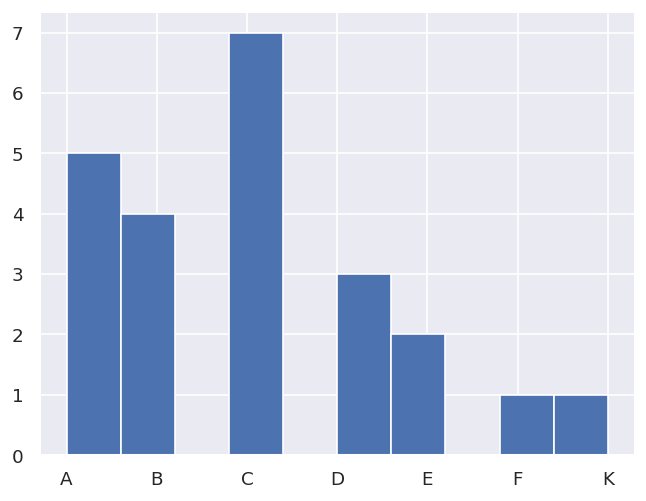

In [13]:
# Run with defaults
# data.classifyFits()

# For more control, pass bins
# Here the minima is set at one end, and a %age range used for bins
minVal = data.fitsSummary['Stats']['redchi']['min']    
binRangePC = 1e-8
data.classifyFits(bins = [minVal, minVal + binRangePC*minVal , 20])

## Explore candidate result sets

Drill-down on a candidate set of results, and examine values and spreads. For more details see {{ PEMtk_docs }}, especially the [analysis routines page](https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_fitting_multiproc_class_analysis_141121-tidy.html). (See also {numref}`Sect. %s <sect:platform:pythonEcosystem>` for details on the plotting libaries implemented here.)

### Raw results

Plot spreads in magnitude and phase parameters. Statistical plots are available for Seaborn and Holoviews backends, with some slightly different options.

In [14]:
# From the candidates, select a group for analysis
selGroup = 'A'

In [15]:
# paramPlot can be used to check the spread on each parameter.
# Plots use Seaborn or Holoviews/Bokeh
# Colour-mapping is controlled by the 'hue' paramter, additionally pass hRound for sig. fig control.
# The remap setting allows for short-hand labels as set in data.lmmu

paramType = 'm' # Set for (m)agnitude or (p)hase parameters
hRound = 14 # Set for cmapping, default may be too small (leads to all grey cmap on points)

data.paramPlot(selectors={'Type':paramType, 'redchiGroup':selGroup}, hue = 'redchi', 
               backend=paramPlotBackend, hvType='violin', 
               returnFlag = True, hRound=hRound, remap = 'lmMap');

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


:Overlay
   .Violin.I  :Violin   [Param]   (value)
   .Scatter.I :Scatter   [Param]   (value,redchi)

In [16]:
paramType = 'p' # Set for (m)agnitude or (p)hase parameters
data.paramPlot(selectors={'Type':paramType, 'redchiGroup':selGroup}, hue = 'redchi', backend=paramPlotBackend, hvType='violin', 
               returnFlag = True, hRound=hRound, remap = 'lmMap'); 

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


:Overlay
   .Violin.I  :Violin   [Param]   (value)
   .Scatter.I :Scatter   [Param]   (value,redchi)

### Phases, phase shifts & corrections

Depending on how the fit was configured, phases may be defined in different ways. To set the phases relative to a speific parameter, and wrap to a specified range, use the `phaseCorrection()` method. This defaults to using the first parameter as a reference phase, and wraps to $-\pi:\pi$. The phase-corrected values are output to a new Type, 'pc', and a set of normalised magnitudes to 'n'. Additional settings can be passed for more control, as shown below.

In [17]:
# Run phase correction routine
# Set absFlag=True for unsigned phases (mapped to 0:pi)
# Set useRef=False to set ref phase as 0, otherwise the reference value is set.
phaseCorrParams={'absFlag':True, 'useRef':False}
data.phaseCorrection(**phaseCorrParams)  

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
Set ref param = PU_SG_PU_1_1_n1_1


Param                 PU_SG_PU_1_1_n1_1  PU_SG_PU_1_n1_1_1  PU_SG_PU_3_1_n1_1  \
Fit Type redchiGroup                                                            
1   m    C                        1.664              1.664              1.191   
    n    C                        0.415              0.415              0.297   
    p    C                       -0.861             -0.861              1.087   
    pc   C                        0.000              0.000              1.948   
4   m    K                        1.664              1.664              1.191   
    n    K                        0.415              0.415              0.297   
    p    K                       -0.861             -0.861              1.087   
    pc   K                        0.000              0.000              1.948   
5   m    D                        1.664              1.664              1.191   
    n    D                        0.415              0.415              0.297   
    p    D                       -0.861             -0.861              1.087   
    pc   D                        0.000              0.000              1.948   
7   m    B                        1.664              1.664              1.191   
    n    B                        0.415              0.415              0.297   
    p    B                       -0.861             -0.861              1.087   
    pc   B                        0.000              0.000              1.948   
8   m    A                        1.664              1.664              1.191   
    n    A                        0.415              0.415              0.297   
    p    A                       -0.861             -0.861              1.087   
    pc   A                        0.000              0.000              1.948   
9   m    C                        1.664              1.664              1.191   
    n    C                        0.415              0.415              0.297   
    p    C                       -0.861             -0.861              1.087   
    pc   C                        0.000              0.000              1.948   
10  m    C                        1.664              1.664              1.191   
    n    C                        0.415              0.415              0.297   
    p    C                       -0.861             -0.861              1.087   
    pc   C                        0.000              0.000              1.948   
11  m    E                        1.664              1.664              1.191   
    n    E                        0.415              0.415              0.297   
    p    E                       -0.861             -0.861              1.087   
    pc   E                        0.000              0.000              1.948   
12  m    C                        1.664              1.664              1.191   
    n    C                        0.415              0.415              0.297   
    p    C                       -0.861             -0.861              1.087   
    pc   C                        0.000              0.000              1.948   
13  m    A                        1.664              1.664              1.191   
    n    A                        0.415              0.415              0.297   
    p    A                       -0.861             -0.861              1.087   
    pc   A                        0.000              0.000              1.948   
14  m    C                        1.664              1.664              1.191   
    n    C                        0.415              0.415              0.297   
    p    C                       -0.861             -0.861              1.087   
    pc   C                        0.000              0.000              1.948   
16  m    D                        1.664              1.664              1.191   
    n    D                        0.415              0.415              0.297   
    p    D                       -0.861             -0.861              1.087   
    pc   D                     

Examine new data types...

In [18]:
paramType = 'n'
data.paramPlot(selectors={'Type':paramType, 'redchiGroup':selGroup}, hue = 'redchi', 
               backend=paramPlotBackend, hvType='violin', kind='box',
               returnFlag = True, hRound=hRound, remap = 'lmMap');

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


:Overlay
   .Violin.I  :Violin   [Param]   (value)
   .Scatter.I :Scatter   [Param]   (value,redchi)

In [19]:
paramType = 'pc'
data.paramPlot(selectors={'Type':paramType, 'redchiGroup':selGroup}, hue = 'redchi', 
               backend=paramPlotBackend, hvType='violin', kind='box',
               returnFlag = True, hRound=hRound, remap = 'lmMap');

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


:Overlay
   .Violin.I  :Violin   [Param]   (value)
   .Scatter.I :Scatter   [Param]   (value,redchi)

## Parameter estimation & fidelity

For case studies, the fit results can be directly compared to the known input parameters. This should give a feel for how well the data defines the matrix elements (parameters) in this case. In general, probing the correlations and spread of results, and comparing to other (unfitted) results is required to estimate fidelity, see {{ QM12 }} for further discussion.

### Best values and statistics

To get a final parameter set and associated statistics, based on a subset of the fit results, the `paramsReport()` method is available. If reference data is available, as for the case studies herein, the `paramsCompare()` method can also be used to compare with the reference case.

In [20]:
# Parameter summary
data.paramsReport(inds = {'redchiGroup':selGroup})

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
Set parameter stats to self.paramsSummary.


Type                              m          n      p         pc
Param             Agg                                           
PU_SG_PU_1_1_n1_1 min     1.664e+00  4.148e-01 -0.861  0.000e+00
                  mean    1.664e+00  4.148e-01 -0.861  0.000e+00
                  median  1.664e+00  4.148e-01 -0.861  0.000e+00
                  max     1.664e+00  4.148e-01 -0.861  0.000e+00
                  std     2.148e-05  5.346e-06  0.000  0.000e+00
                  var     4.612e-10  2.858e-11  0.000  0.000e+00
PU_SG_PU_1_n1_1_1 min     1.664e+00  4.148e-01 -0.861  0.000e+00
                  mean    1.664e+00  4.148e-01 -0.861  0.000e+00
                  median  1.664e+00  4.148e-01 -0.861  0.000e+00
                  max     1.664e+00  4.148e-01 -0.861  0.000e+00
                  std     2.148e-05  5.346e-06  0.000  0.000e+00
                  var     4.612e-10  2.858e-11  0.000  0.000e+00
PU_SG_PU_3_1_n1_1 min     1.191e+00  2.968e-01 -2.809  1.948e+00
                  mean    1.191e+00  2.969e-01  0.308  1.948e+00
                  median  1.191e+00  2.969e-01  1.087  1.948e+00
                  max     1.191e+00  2.969e-01  1.087  1.948e+00
                  std     2.889e-05  7.207e-06  1.743  2.135e-05
                  var     8.345e-10  5.194e-11  3.037  4.559e-10
PU_SG_PU_3_n1_1_1 min     1.191e+00  2.968e-01 -2.809  1.948e+00
                  mean    1.191e+00  2.969e-01  0.308  1.948e+00
                  median  1.191e+00  2.969e-01  1.087  1.948e+00
                  max     1.191e+00  2.969e-01  1.087  1.948e+00
                  std     2.889e-05  7.207e-06  1.743  2.135e-05
                  var     8.345e-10  5.194e-11  3.037  4.559e-10
SU_SG_SU_1_0_0_1  min     2.619e+00  6.528e-01  2.210  3.071e+00
                  mean    2.619e+00  6.528e-01  2.238  3.071e+00
                  median  2.619e+00  6.528e-01  2.210  3.071e+00
                  max     2.619e+00  6.528e-01  2.352  3.071e+00
                  std     4.318e-06  1.081e-06  0.063  4.450e-05
                  var     1.865e-11  1.168e-12  0.004  1.980e-09
SU_SG_SU_3_0_0_1  min     9.281e-01  2.314e-01 -1.149  2.876e-01
                  mean    9.281e-01  2.314e-01 -1.034  2.876e-01
                  median  9.281e-01  2.314e-01 -1.149  2.876e-01
                  max     9.281e-01  2.314e-01 -0.573  2.877e-01
                  std     1.349e-05  3.363e-06  0.257  3.212e-05
                  var     1.821e-10  1.131e-11  0.066  1.032e-09

In [21]:
# Parameter comparison
# Note this uses phaseCorrParams as set previously for consistency
data.paramsCompare(phaseCorrParams=phaseCorrParams)

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
Set ref param = PU_SG_PU_1_1_n1_1


Param     PU_SG_PU_1_1_n1_1  PU_SG_PU_1_n1_1_1  PU_SG_PU_3_1_n1_1  \
Fit Type                                                            
ref m                 1.785              1.785              0.803   
    n                 0.445              0.445              0.200   
    p                -0.861             -0.861             -3.120   
    pc                0.000              0.000              2.259   

Param     PU_SG_PU_3_n1_1_1  SU_SG_SU_1_0_0_1  SU_SG_SU_3_0_0_1  
Fit Type                                                         
ref m                 0.803             2.686             1.109  
    n                 0.200             0.669             0.276  
    p                -3.120             2.611            -0.079  
    pc                2.259             2.811             0.782

Set parameter comparison to self.paramsSummaryComp.


/home/jovyan/github/PEMtk/pemtk/fit/_analysis.py:440: PerformanceWarning: indexing past lexsort depth may impact performance.
  dataMerge[item,'diff/std', pcName] = np.abs(dataMerge[item,'diff']/dataMerge[item]['std'] *100)
/home/jovyan/github/PEMtk/pemtk/fit/_analysis.py:440: PerformanceWarning: indexing past lexsort depth may impact performance.
  dataMerge[item,'diff/std', pcName] = np.abs(dataMerge[item,'diff']/dataMerge[item]['std'] *100)


Param                PU_SG_PU_1_1_n1_1  PU_SG_PU_1_n1_1_1  PU_SG_PU_3_1_n1_1  \
Type Source   dType                                                            
m    mean     num            1.664e+00          1.664e+00          1.191e+00   
     ref      num            1.785e+00          1.785e+00          8.029e-01   
     diff     %              7.268e+00          7.268e+00          3.257e+01   
              num           -1.209e-01         -1.209e-01          3.879e-01   
     std      %              1.291e-03          1.291e-03          2.426e-03   
              num            2.148e-05          2.148e-05          2.889e-05   
     diff/std %              5.631e+05          5.631e+05          1.343e+06   
n    mean     num            4.148e-01          4.148e-01          2.969e-01   
     ref      num            4.447e-01          4.447e-01          2.001e-01   
     diff     %              7.222e+00          7.222e+00          3.260e+01   
              num           -2.995e-02         -2.995e-02          9.678e-02   
     std      %              1.289e-03          1.289e-03          2.428e-03   
              num            5.346e-06          5.346e-06          7.207e-06   
     diff/std %              5.602e+05          5.602e+05          1.343e+06   
p    mean     num           -8.610e-01         -8.610e-01          3.079e-01   
     ref      num           -8.610e-01         -8.610e-01         -3.120e+00   
     diff     %              0.000e+00          0.000e+00          1.113e+03   
              num            0.000e+00          0.000e+00          3.428e+00   
     std      %              0.000e+00          0.000e+00          5.659e+02   
              num            0.000e+00          0.000e+00          1.743e+00   
     diff/std %                    NaN                NaN          1.967e+02   
pc   mean     num            0.000e+00          0.000e+00          1.948e+00   
     ref      num            0.000e+00          0.000e+00          2.259e+00   
     diff     %                    NaN                NaN          1.597e+01   
              num            0.000e+00          0.000e+00         -3.111e-01   
     std      %                    NaN                NaN          1.096e-03   
              num            0.000e+00          0.000e+00          2.135e-05   
     diff/std %                    NaN                NaN          1.457e+06   

Param                PU_SG_PU_3_n1_1_1  SU_SG_SU_1_0_0_1  SU_SG_SU_3_0_0_1  
Type Source   dType                                                         
m    mean     num            1.191e+00         2.619e+00         9.281e-01  
     ref      num            8.029e-01         2.686e+00         1.109e+00  
     diff     %              3.257e+01         2.575e+00         1.951e+01  
              num            3.879e-01        -6.744e-02        -1.811e-01  
     std      %              2.426e-03         1.649e-04         1.454e-03  
              num            2.889e-05         4.318e-06         1.349e-05  
     diff/std %              1.343e+06         1.562e+06         1.342e+06  
n    mean     num            2.969e-01         6.528e-01         2.314e-01  
     ref      num            2.001e-01         6.693e-01         2.764e-01  
     diff     %              3.260e+01         2.531e+00         1.946e+01  
              num            9.678e-02        -1.652e-02        -4.502e-02  
     std      %              2.428e-03         1.655e-04         1.454e-03  
              num            7.207e-06         1.081e-06         3.363e-06  
     diff/std %              1.343e+06         1.529e+06         1.338e+06  
p    mean     num            3.079e-01         2.238e+00        -1.034e+00  
     ref      num           -3.120e+00         2.611e+00        -7.868e-02  
     diff     %              1.113e+03         1.668e+01         9.239e+01  
              num            3.428e+00        -3.732e-01        -9.549e-01  
     std      %              5.659e+02         2.834e+00   

In [22]:
# Display above results With column name remapping to (l,m) labels only

# With Pandas functionality
data.paramsSummaryComp.rename(columns=data.lmmu['lmMap'])

# With utility method
# summaryRenamed = pemtk.fit._util.renameParams(data.paramsSummaryComp, data.lmmu['lmMap']) 
# summaryRenamed

Param                      1,1       1,-1        3,1       3,-1        1,0  \
Type Source   dType                                                          
m    mean     num    1.664e+00  1.664e+00  1.191e+00  1.191e+00  2.619e+00   
     ref      num    1.785e+00  1.785e+00  8.029e-01  8.029e-01  2.686e+00   
     diff     %      7.268e+00  7.268e+00  3.257e+01  3.257e+01  2.575e+00   
              num   -1.209e-01 -1.209e-01  3.879e-01  3.879e-01 -6.744e-02   
     std      %      1.291e-03  1.291e-03  2.426e-03  2.426e-03  1.649e-04   
              num    2.148e-05  2.148e-05  2.889e-05  2.889e-05  4.318e-06   
     diff/std %      5.631e+05  5.631e+05  1.343e+06  1.343e+06  1.562e+06   
n    mean     num    4.148e-01  4.148e-01  2.969e-01  2.969e-01  6.528e-01   
     ref      num    4.447e-01  4.447e-01  2.001e-01  2.001e-01  6.693e-01   
     diff     %      7.222e+00  7.222e+00  3.260e+01  3.260e+01  2.531e+00   
              num   -2.995e-02 -2.995e-02  9.678e-02  9.678e-02 -1.652e-02   
     std      %      1.289e-03  1.289e-03  2.428e-03  2.428e-03  1.655e-04   
              num    5.346e-06  5.346e-06  7.207e-06  7.207e-06  1.081e-06   
     diff/std %      5.602e+05  5.602e+05  1.343e+06  1.343e+06  1.529e+06   
p    mean     num   -8.610e-01 -8.610e-01  3.079e-01  3.079e-01  2.238e+00   
     ref      num   -8.610e-01 -8.610e-01 -3.120e+00 -3.120e+00  2.611e+00   
     diff     %      0.000e+00  0.000e+00  1.113e+03  1.113e+03  1.668e+01   
              num    0.000e+00  0.000e+00  3.428e+00  3.428e+00 -3.732e-01   
     std      %      0.000e+00  0.000e+00  5.659e+02  5.659e+02  2.834e+00   
              num    0.000e+00  0.000e+00  1.743e+00  1.743e+00  6.343e-02   
     diff/std %            NaN        NaN  1.967e+02  1.967e+02  5.883e+02   
pc   mean     num    0.000e+00  0.000e+00  1.948e+00  1.948e+00  3.071e+00   
     ref      num    0.000e+00  0.000e+00  2.259e+00  2.259e+00  2.811e+00   
     diff     %            NaN        NaN  1.597e+01  1.597e+01  8.460e+00   
              num    0.000e+00  0.000e+00 -3.111e-01 -3.111e-01  2.598e-01   
     std      %            NaN        NaN  1.096e-03  1.096e-03  1.449e-03   
              num    0.000e+00  0.000e+00  2.135e-05  2.135e-05  4.450e-05   
     diff/std %            NaN        NaN  1.457e+06  1.457e+06  5.837e+05   

Param                      3,0  
Type Source   dType             
m    mean     num    9.281e-01  
     ref      num    1.109e+00  
     diff     %      1.951e+01  
              num   -1.811e-01  
     std      %      1.454e-03  
              num    1.349e-05  
     diff/std %      1.342e+06  
n    mean     num    2.314e-01  
     ref      num    2.764e-01  
     diff     %      1.946e+01  
              num   -4.502e-02  
     std      %      1.454e-03  
              num    3.363e-06  
     diff/std %      1.338e+06  
p    mean     num   -1.034e+00  
     ref      num   -7.868e-02  
     diff     %      9.239e+01  
              num   -9.549e-01  
     std      %      2.489e+01  
              num    2.573e-01  
     diff/std %      3.712e+02  
pc   mean     num    2.876e-01  
     ref      num    7.824e-01  
     diff     %      1.720e+02  
              num   -4.947e-01  
     std      %      1.117e-02  
              num    3.212e-05  
     diff/std %      1.540e+06

In [23]:
# Plot values vs. reference cases
# NOTE - experimental code, not yet consolidated and wrapped in PEMtk

paramType = 'm'

# Set new DataFrame including "vary" info (missing in default case)
pDict = 'dfWideTest'
# Try using existing function with extra index set...
data._setWide(indexDims = ['Fit','Type','chisqrGroup','redchiGroup','batch', 'vary'], dataWide='dfWideTest')

# plotData = data.paramPlot(dataDict = pDict, selectors={'vary':True, 'Type':'m', 'redchiGroup':selGroup}, hue = 'chisqr', backend='hv', hvType='violin', returnFlag = True, plotScatter=True, remap = 'lmMap', hRound = 12) 
# NO REMAP CASE
plotData = data.paramPlot(dataDict = pDict, selectors={'vary':True, 'Type':paramType, 'redchiGroup':selGroup}, hue = 'chisqr', 
                          backend='hv', hvType='violin', returnFlag = True, plotScatter=True, hRound=hRound)  #, remap='lmMap') 
p1 = data.data['plots']['paramPlot']
# p2 = dataTestSub.hvplot.scatter(x='Param',y='value', marker='o', size=200, color='green')

# Plot ref params... CURRENTLY NOT IN paraPlot(), and that also expects fit data so can't reuse directly here.

dataTest = data.data['fits']['dfRef'].copy()
# data.paramPlot(dataDict = 'dfRef')

# Set axis remap
# dataTest.replace({'Param':data.lmmu['lmMap']}, inplace=True)

# Subset
dataTestSub = data._subsetFromXS(selectors = {'Type':paramType}, data = dataTest)  
p2 = dataTestSub.hvplot.scatter(x='Param',y='value', marker='dash', size=500, color='red')

# p1+p2   # Overlays fail with "NotImplementedError: Iteration on Elements is not supported." Issue with plot types? FIXED - issues was non-plot return from paramPlot()!
p1*p2

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


:Overlay
   .Violin.I  :Violin   [Param]   (value)
   .Scatter.I :Scatter   [Param]   (value,chisqr)

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


:Overlay
   .Violin.I   :Violin   [Param]   (value)
   .Scatter.I  :Scatter   [Param]   (value,chisqr)
   .Scatter.II :Scatter   [Param]   (value)

## Using the reconstructed matrix elements

The results tables are accessible directly, and there are also methods to reformat the best fit results for use in further calculations.

In [24]:
# self.paramsSummary contains the results above as Pandas Dataframe, usual Pandas methods can be applied.
data.paramsSummary['data'].describe()

Param,PU_SG_PU_1_1_n1_1,PU_SG_PU_1_n1_1_1,PU_SG_PU_3_1_n1_1,PU_SG_PU_3_n1_1_1,SU_SG_SU_1_0_0_1,SU_SG_SU_3_0_0_1
count,20.000,20.000,20.000,20.000,20.000,20.000
mean,0.304,0.304,0.936,0.936,2.145,0.103
std,0.933,0.933,1.066,1.066,0.935,0.739
min,-0.861,-0.861,-2.809,-2.809,0.653,-1.149
25%,-0.215,-0.215,0.297,0.297,1.820,0.030
50%,0.207,0.207,1.139,1.139,2.485,0.259
75%,0.727,0.727,1.380,1.380,2.732,0.448
max,1.664,1.664,1.948,1.948,3.071,0.928


In [25]:
# To set matrix elements from aggregate fit results, use `seetAggMatE` for Pandas
data.setAggMatE(simpleForm = True)
data.data['agg']['matEpd']

Set reformatted aggregate data to self.data[agg][matEpd].


Type              m      n      p     pc          comp         compC labels
Cont l m  mu                                                               
PU   1 -1  1  1.664  0.415 -0.861  0.000  1.084-1.262j  0.415+0.000j   1,-1
        1 -1  1.664  0.415 -0.861  0.000  1.084-1.262j  0.415+0.000j    1,1
     3 -1  1  1.191  0.297  0.308  1.948  1.135+0.361j -0.109+0.276j   3,-1
        1 -1  1.191  0.297  0.308  1.948  1.135+0.361j -0.109+0.276j    3,1
SU   1  0  0  2.619  0.653  2.238  3.071 -1.620+2.057j -0.651+0.046j    1,0
     3  0  0  0.928  0.231 -1.034  0.288  0.475-0.797j  0.222+0.066j    3,0

In [26]:
# To set matrix elements from aggregate fit results, use `aggToXR` for Xarray
# data.aggToXR(refKey = 'orb5', returnType = 'ds', conformDims=True)   # use full ref dataset
data.aggToXR(refKey = 'subset', returnType = 'ds', conformDims=True)   # Subselected matE

Added dim Targ
Added dim Total
Added dim Targ
Added dim Total
Set XR dataset for self.data['agg']['matE']


In [27]:
data.data['agg']['matE']

<xarray.Dataset>
Dimensions:  (Type: 2, Sym: 4, mu: 3, LM: 6, it: 1)
Coordinates:
  * Type     (Type) object 'comp' 'compC'
  * Sym      (Sym) MultiIndex
  - Cont     (Sym) object 'PU' 'PU' 'SU' 'SU'
  - Targ     (Sym) object 'SG' 'U' 'SG' 'U'
  - Total    (Sym) object 'PU' 'U' 'SU' 'U'
  * mu       (mu) int64 -1 0 1
  * LM       (LM) MultiIndex
  - l        (LM) int64 1 1 1 3 3 3
  - m        (LM) int64 -1 0 1 -1 0 1
  * it       (it) int64 1
    Eke      float64 1.1
    Ehv      float64 18.4
    SF       complex128 (2.2237521+3.6277801j)
Data variables:
    comp     (Type, mu, Sym, LM) complex128 (nan+nanj) (nan+nanj) ... (nan+nanj)
    compC    (Type, mu, Sym, LM) complex128 (nan+nanj) (nan+nanj) ... (nan+nanj)
    subset   (LM, Sym, mu, it) complex128 (nan+nanj) (nan+nanj) ... (nan+nanj)

### Density matrices

New (experimental) code for density matrix plots and comparison. See {numref}`Sect. %s <sec:density-mat-basicsec:density-mat-basic>` for discussion. Code adapted from the {{ PEMtk_docs }} [MF reconstruction page](https://pemtk.readthedocs.io/en/latest/topical_review_case_study/matrix_element_extraction_MFrecon_PEMtk_180722-dist.html#Density-matrix-plottinghttps://pemtk.readthedocs.io/en/latest/topical_review_case_study/matrix_element_extraction_MFrecon_PEMtk_180722-dist.html#Density-matrix-plotting), original analysis for Ref. {cite}`hockett2023TopicalReviewExtracting`, illustrating the $N_2$ case.

In [28]:
# import numpy as np

def unsignedPhase(da):
    """Convert to unsigned phases."""
    # Set mag, phase
    mag = da.pipe(np.abs)
    phase = da.pipe(np.angle)  # Returns np array only!
    
    # Set unsigned
    magUS = mag.pipe(np.abs)
#     phaseUS = phase.pipe(np.abs)  
    phaseUS = np.abs(phase)
    
    # Set complex
    compFixed = magUS * np.exp(1j* phaseUS)
#     return mag,phase
    return compFixed

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
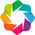

Set plot kdims to ['l,m,mu', 'l,m,mu_p']; pass kdims = [dim1,dim2] for more control.


Set plot kdims to ['l,m,mu', 'l,m,mu_p']; pass kdims = [dim1,dim2] for more control.
Set plot kdims to ['l,m,mu', 'l,m,mu_p']; pass kdims = [dim1,dim2] for more control.


:Layout
   .NdLayout.Left_parenthesis_a_right_parenthesis_Reference_density_matrix_left_parenthesis_unsigned_phases_right_parenthesis :NdLayout   [Component]
      :HeatMap   [l,m,mu,l,m,mu_p]   (n2_3sg_0.1-50.1eV_A2.inp.out)
   .NdLayout.Left_parenthesis_b_right_parenthesis_Reconstructed                                                               :NdLayout   [pType]
      :HeatMap   [l,m,mu,l,m,mu_p]   (compC)
   .NdLayout.Left_parenthesis_c_right_parenthesis_Difference                                                                  :NdLayout   [pType]
      :HeatMap   [l,m,mu,l,m,mu_p]   (Difference)

In [29]:
# v2 - as v1, but differences for unsigned phase case & fix labels
# 26/07/22: messy but working. Some labelling tricks to push back into matPlot() routine

# Import routines
from epsproc.calc import density


# Compose density matrix

# Set dimensions/state vector/representation
# These must be in original data, but will be restacked as necessary to define the effective basis space.
denDims = ['LM', 'mu']
selDims = {'Type':'L'}
pTypes=['r','i']
thres = 1e-2    # 0.2 # Threshold out l>3 terms if using full 'orb5' set.
normME = False
normDen = 'max'
usPhase = True # Use unsigned phases?

# Calculate - Ref case
# matE = data.data['subset']['matE']
# Set data from master class
# k = 'orb5'  # N2 orb5 (SG) dataset
k = 'subset'
matE = data.data[k]['matE']
if normME:
    matE = matE/matE.max()

if usPhase:
    matE = unsignedPhase(matE)
    
daOut, *_ = density.densityCalc(matE, denDims = denDims, selDims = selDims, thres = thres)  # OK

if normDen=='max':
    daOut = daOut/daOut.max()
elif normDen=='trace':
    daOut = daOut/(daOut.sum('Sym').pipe(np.trace)**2)  # Need sym sum here to get 2D trace
    
# daPlot = density.matPlot(daOut.sum('Sym'))
daPlot = density.matPlot(daOut.sum('Sym'), pTypes=pTypes)

# Retrieved
matE = data.data['agg']['matE']['compC']
selDims = {'Type':'compC'}  # For stacked DS case need to set selDims again here to avoid null data selection below.
if normME:
    matE = matE/matE.max()
    
if usPhase:
    matE = unsignedPhase(matE)
    
daOut2, *_ = density.densityCalc(matE, denDims = denDims, selDims = selDims, thres = thres)  # OK

if normDen=='max':
    daOut2 = daOut2/daOut2.max()
elif normDen=='trace':
    daOut2 = daOut2/(daOut2.sum('Sym').pipe(np.trace)**2)
    
daPlot2 = density.matPlot(daOut2.sum('Sym'), pTypes=pTypes)   #.sel(Eke=slice(0.5,1.5,1)))


# Compute difference
if usPhase:
    daDiff = unsignedPhase(daOut.sum('Sym')) - unsignedPhase(daOut2.sum('Sym'))

else:
    daDiff = daOut.sum('Sym') - daOut2.sum('Sym')

daDiff.name = 'Difference'
daPlotDiff = density.matPlot(daDiff, pTypes=pTypes)



#******** Plot
daLayout = (daPlot.redim(pType='Component').layout('Component').relabel('(a) Reference density matrix (unsigned phases)') + daPlot2.opts(show_title=False).layout('pType').opts(show_title=True).relabel('(b) Reconstructed') + 
                daPlotDiff.opts(show_title=False).layout('pType').opts(show_title=True).relabel('(c) Difference')).cols(1)  
daLayout.opts(ep.plot.hvPlotters.opts.HeatMap(width=300, frame_width=300, aspect='square', tools=['hover'], colorbar=True, cmap='coolwarm'))  # .opts(show_title=False)  # .opts(title="Custom Title")  #OK



# Notes on titles... see https://holoviews.org/user_guide/Customizing_Plots.html
#
# .relabel('Test') and .opts(title="Custom Title") OK for whole row titles
#
# daPlot2.opts(show_title=False).layout('pType').opts(show_title=True).relabel('Recon')  Turns off titles per plot, then titles layout
#
# .redim() to modify individual plot group label (from dimension name) 

If the reconstruction is good, the differences (fidelity) should be on the order of the experimental noise level/reconstruction uncertainty, around 10% in the case studies herein.

### Plot MF PADs

Routines as per https://pemtk.readthedocs.io/en/latest/topical_review_case_study/MFPAD_replotting_from_file_190722-dist.html - currently not working. Seems to be some difference in dim stacking/assignment now...? Might be Python/Xarray version change, or PEMtk/ePSproc implementation.

In [30]:
dataIn = data.data['agg']['matE'].copy()

# # Restack for MFPAD plotter
# from epsproc.util.listFuncs import dataTypesList

# refDims = dataTypesList()
# refDims = refDims['matE']['def']
# dataStacked = dataIn.stack(refDims(sType='sDict'))
# dataStacked

# # Style 1: if full ref dataset included (with Eke dim)
# # Create empty ePSbase class instance, and set data
# # Can then use existing  padPlot() routine for all data
# from epsproc.classes.base import ePSbase
# dataTest = ePSbase(verbose = 1)

# aList = [i for i in dataIn.data_vars]  # List of arrays

# # Loop version & propagate attrs
# dataType = 'matE'
# for item in aList:
#     if item.startswith('orb'):
#         selType='L'
#     else:
#         selType = item
        
#     dataTest.data[item] = {dataType : dataIn[item].sel({'Type':selType})}

# Style 2: single Eke dim case
# Create empty ePSbase class instance, and set data
# Can then use existing  padPlot() routine for all data
from epsproc.classes.base import ePSbase
dataTest = ePSbase(verbose = 1)

aList = [i for i in dataIn.data_vars]  # List of arrays

# Loop version & propagate attrs
dataType = 'matE'
for item in aList:
    if item.startswith('sub'):
        dataTest.data[item] = {dataType : dataIn[item]}
    else:
        selType = item
        dataTest.data[item] = {dataType : dataIn[item].sel({'Type':selType})}
        
    # Push singleton Eke value to dim for plotter
    dataTest.data[item][dataType] = dataTest.data[item][dataType].expand_dims('Eke')
    



In [31]:
aList

['comp', 'compC', 'subset']

Summing over dims: {'Sym'}
Plotting from self.data[comp][TX], facetDims=['Eke', 'Labels'], pType=a2 with backend=pl.
*** WARNING: plot dataset has min value < 0, min = (-1.1365256432548096+0.6404348992632859j). This may be unphysical and/or result in plotting issues.


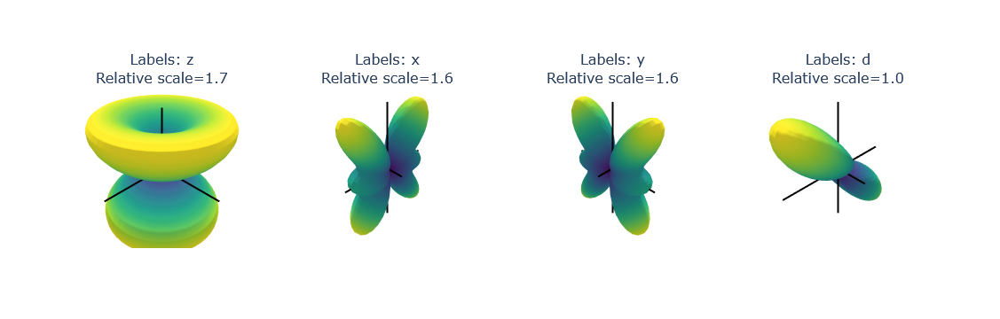

Set plot to self.data['comp']['plots']['TX']['polar']
Summing over dims: {'Sym'}
Plotting from self.data[compC][TX], facetDims=['Eke', 'Labels'], pType=a2 with backend=pl.
*** WARNING: plot dataset has min value < 0, min = (-0.28119347695513575-0.013586067969082197j). This may be unphysical and/or result in plotting issues.


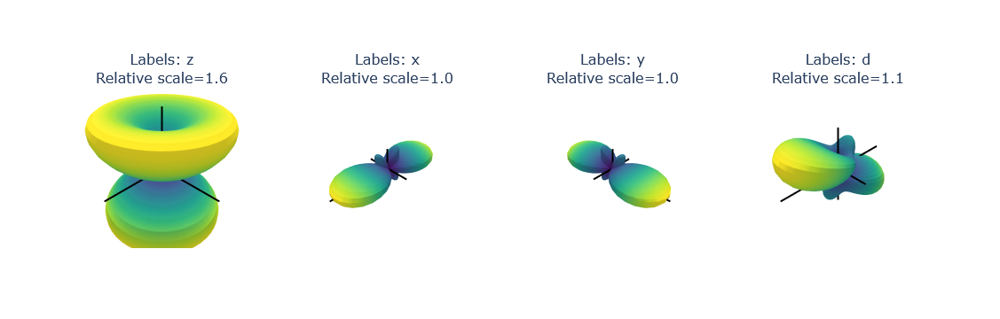

Set plot to self.data['compC']['plots']['TX']['polar']
Summing over dims: {'Sym'}
Plotting from self.data[subset][TX], facetDims=['Eke', 'Labels'], pType=a2 with backend=pl.
*** WARNING: plot dataset has min value < 0, min = (-0.994014724613836+0.6180516033545451j). This may be unphysical and/or result in plotting issues.


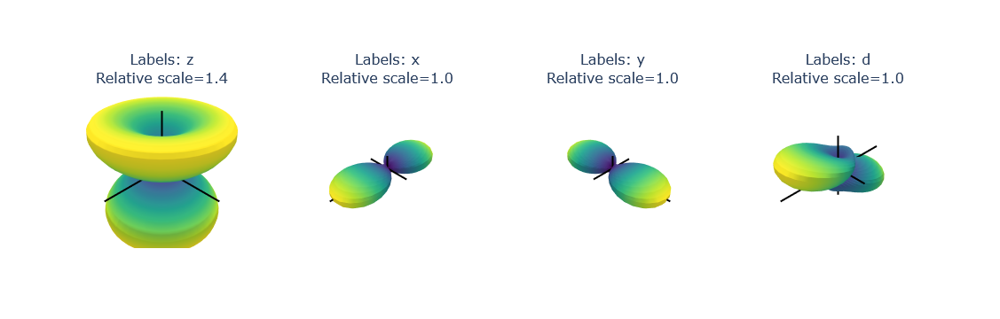

Set plot to self.data['subset']['plots']['TX']['polar']
Summing over dims: set()
Plotting from self.data[diff][TX], facetDims=['Eke', 'Labels'], pType=a2 with backend=pl.
*** WARNING: plot dataset has min value < 0, min = (-0.7247177498614888+0.4373930407233714j). This may be unphysical and/or result in plotting issues.


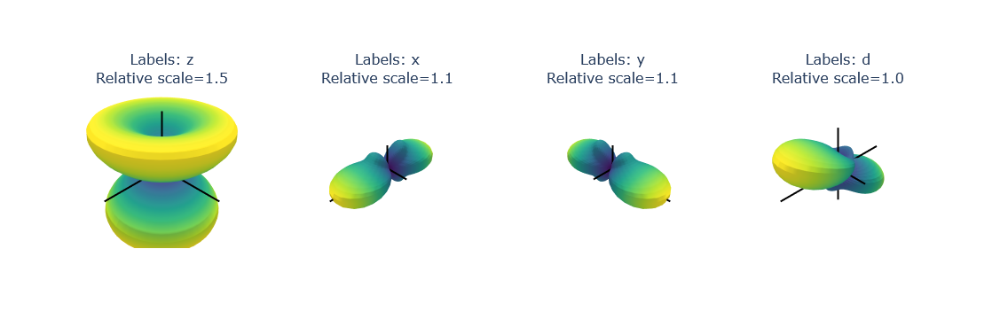

Set plot to self.data['diff']['plots']['TX']['polar']


In [33]:
# Set polarization geoms from Euler angles

import numpy as np
import epsproc as ep

# Set Euler angs to include diagonal
pRot = [0, 0, np.pi/2, 0]
tRot = [0, np.pi/2, np.pi/2, np.pi/4]
cRot = [0, 0, 0, 0]
labels = ['z','x','y', 'd']
eulerAngs = np.array([labels, pRot, tRot, cRot]).T   # List form to use later, rows per set of angles


# Should also use MFBLM function below instead of numeric version?
R = ep.setPolGeoms(eulerAngs = eulerAngs)
# R

# Basic version - working, but get separate plots per set.
# UPDATE: use this to generate all raw figures, then restack plotly objects below

Erange=[1,2,1]

# Comparison and diff
pKey = [i for i in dataIn.data_vars]  # List of arrays
dataTest.mfpadNumeric(keys=pKey, R = R)   # Compute MFPADs for each set of matrix elements
ep.mfpad
# dataTest.data['diff'] = {'TX': dataTest.data['subset']['TX']-dataTest.data['compC']['TX']}
dataTest.data['diff'] = {'TX': dataTest.data['subset']['TX'].sum('Sym')-dataTest.data['compC']['TX'].sum('Sym')}  # Add sum over sym to force matching dims
pKey.extend(['diff'])

dataTest.padPlot(keys=pKey, Erange=Erange, backend='pl',returnFlag=True, plotFlag=True) # Generate plotly polar surf plots for each dataset


In [35]:
# SKIP THIS - output very slow!
# TODO: fix plot labelling above.

# Version for unified plotting - stack individual plots to grid
# See https://plotly.com/python/subplots
# And https://plot.ly/python/3d-subplots

saveFigs = True
from datetime import datetime as dt
timeString = dt.now()

import plotly.graph_objects as go
from plotly.subplots import make_subplots

#*** Set gridding
# rc = [int(np.ceil(rc[0])), int(np.ceil(rc[1]))]
rc=[4,4]  # All data
# rc=[2,2]  # Test set
showscale = False

#*** Set data norms
# norm = None #
norm = 'global'

Rmax = 1.1
padding = 0.1
aRanges = dict(range=[-(Rmax + padding), Rmax+padding])
aspect = 'cube' # 'auto' # 'cube'   # 'auto' with no ranges is pretty good, or set ranges & use cube (otherwise get distorted shapes)

#*** Set camera
# Camera settings, https://plotly.com/python/3d-camera-controls/
# camera = dict(eye=dict(x=2, y=2, z=0.1))

# Defaults
# Default parameters which are used when `layout.scene.camera` is not provided
# camera = dict(
#     up=dict(x=0, y=0, z=1),
#     center=dict(x=0, y=0, z=0),
#     eye=dict(x=1.25, y=1.25, z=1.25)
# )

# Slightly lower... plus x-rotation
camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=0, y=0, z=0),
    # eye=dict(x=0.8, y=1.25, z=0.8)  # Not bad... bit close?
    eye=dict(x=0.8, y=1.5, z=0.8)
)


#*** Set subplots
pType = {'type':'surface'}
specs = [[pType] * rc[1] for i in range(rc[0])]  # Set specs as 2D list of dicts.

# titles = [f"{facetDim}: {item.item()}" for item in dataPlot[facetDim]]
titles = []
colTitles =  [f'Pol({item.upper()})' for item in dataTest.data['subset']['TX'].Labels.values[0:rc[1]].tolist()]
# rowTitles = ['Mean', 'Mean phase-corrected', 'Ref', 'Diff(Ref - PC)']
rowTitles = ['Ref', 'Mean phase-corrected', 'Diff(Ref - PC)', 'Mean']

# pKey = [pKey[2], pKey[0:1], pKey[3]]  # ['comp', 'compC', 'orb5', 'diff']
pKey = ['subset', 'compC', 'diff', 'comp']   # Row ordering

fig = make_subplots(rows=rc[0], cols=rc[1], specs=specs, subplot_titles=titles, 
                    column_titles = colTitles, row_titles = rowTitles,
                    vertical_spacing = 0.05) # Note basic row/whitespace control here
fig.update_layout(height=1200, width=1200)

# Loop & grid from existing objects
n=0
for rInd in range(1,rc[0]+1):
    for cInd in range(1,rc[1]+1):
        
        # print(f'{rInd},{cInd}')
        trace = dataTest.data[pKey[rInd-1]]['plots']['TX']['polar'][0].data[cInd-1]
        
        fig.add_trace(go.Surface(x=trace['x'], y=trace['y'], z=trace['z'], colorscale='Viridis', showscale=showscale),
                    row=rInd, col=cInd)
        
        # Set string for "scene" (axis) object to update - will be labelled scene1, scene2... by Plotly.
        n=n+1
        sceneN = f'scene{n}'
        if norm == 'global':
            # Try looping... OK with dict unpacking... huzzah!
            # NOTE Scene indexing starts at 1, so do this after n increments
            # options = dict(xaxis = aRanges, yaxis = aRanges, zaxis = aRanges, aspectmode='cube')
            options = dict(xaxis = aRanges, yaxis = aRanges, zaxis = aRanges, aspectmode=aspect, camera=camera)

        else:
            # options = dict(aspectmode='cube')
            # options = dict(aspectmode='auto')  # Better for scaling up details?
            options = dict(aspectmode=aspect, camera=camera)

        fig.update_layout(**{sceneN:options})  # No effect of aspect here? auto/cube/data/manual


# fig.show()   # fig.show() quite slow for multiple surface plots - export & viewing seems better!
if saveFigs:
    fName = f'dataDump_1000fitTests_multiFit_noise_051021_MFPADs_{timeString.strftime("%d%m%y")}'
    fig.write_html(f'{fName}.html')
    fig.write_image(f'{fName}.png')

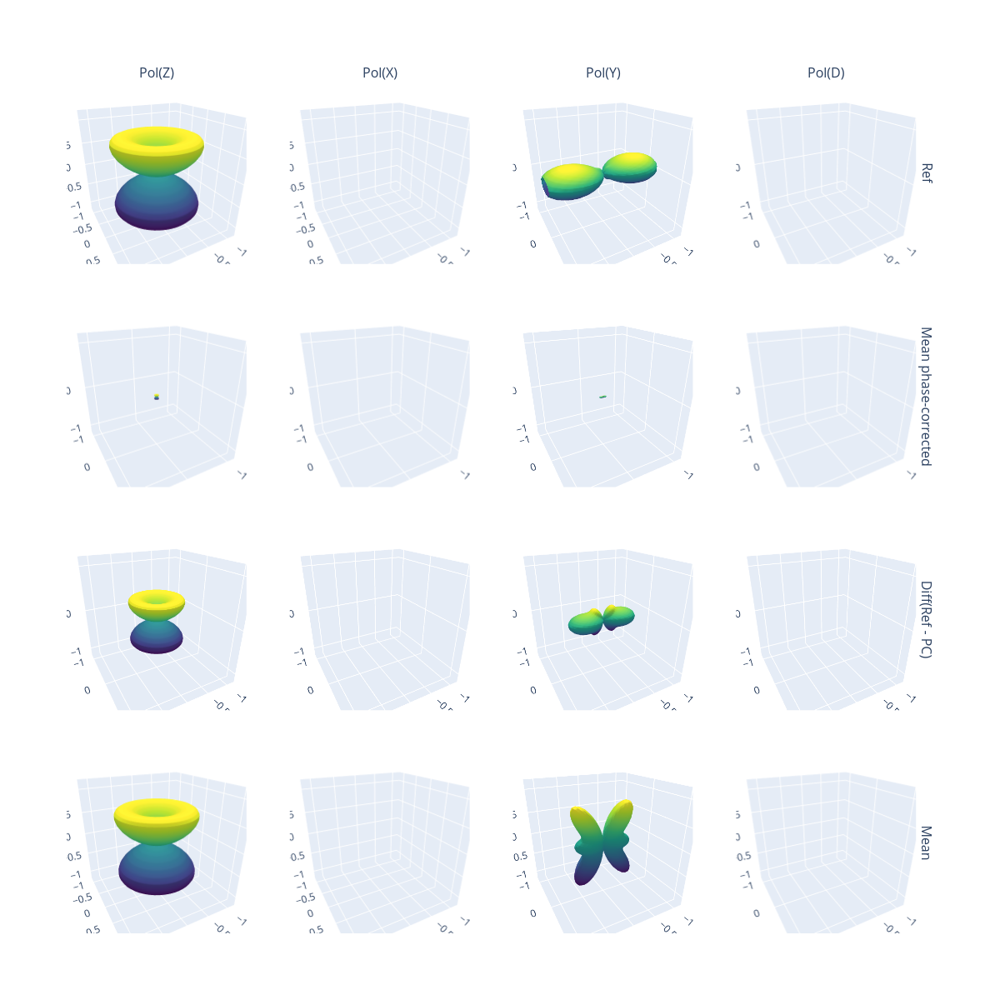

In [38]:
# Optional plot in notebook
# fig.show()   # Interactive plot - maybe quite slow

# Show image
Image(f'{fName}.png')

In [ ]:
dataTest.data[pKey[rInd-1]]['plots']['TX']['polar'][0].data
# dataTest.data[pKey[rInd-1]]['plots']['TX']['polar'][0].data[cInd-1]

# SCRATCH

In [ ]:
data.lmmu  #['lmMap']

In [ ]:
data.paramsSummaryComp.columns

In [ ]:
remap = 'lmMap'
data.paramsSummaryComp.replace({'Param':data.lmmu[remap]}, inplace=False)

In [ ]:
data.paramFidelity()